# Imports

In [49]:
# PyABC imports
from pyabc import (ABCSMC, Distribution, RV,
                   History, MedianEpsilon)
from pyabc.populationstrategy import ConstantPopulationSize, AdaptivePopulationSize
from pyabc.epsilon import MedianEpsilon
from pyabc.sampler import MulticoreEvalParallelSampler

In [50]:
# Custom imports
from ionchannelABC import (ion_channel_sum_stats_calculator,
                           IonChannelAcceptor,
                           IonChannelDistance,
                           EfficientMultivariateNormalTransition,
                           calculate_parameter_sensitivity,
                           plot_parameter_sensitivity,
                           plot_regression_fit,
                           plot_parameters_kde,
                           plot_sim_results,
                           plot_distance_weights)

In [51]:
# Other necessary imports
import numpy as np
import subprocess
import pandas as pd
import io
import os
import tempfile

In [52]:
# Plotting imports
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
%config Inline.Backend.figure_format = 'retina'

# Create the ion channel model

In [53]:
from channels.iha_generic import iha as model
#model.sample({})

# Get experimental measurements

In [54]:
measurements = model.get_experiment_data()
obs = measurements.to_dict()['y']
exp = measurements.to_dict()['exp']
errs = measurements.to_dict()['errs']

# Set limits and generate uniform initial priors

In [55]:
limits = dict(g_ha=(0, 0.2),
              Vhalf_y=(-200, 200),
              k_y=(-50, 0),
              c_by=(0, 1000),
              c_ay=(0, 1e6),
              sigma_y=(0, 100),
              Vmax_y=(-200, 200),
              k_i_haNa=(0, 1.0))

# Test parameter sensitivity

In [8]:
parameters = ['iha.'+k for k in limits.keys()]

In [9]:
distance_fn=IonChannelDistance(
    obs=obs,
    exp_map=exp,
    err_bars=errs,
    err_th=0.1)

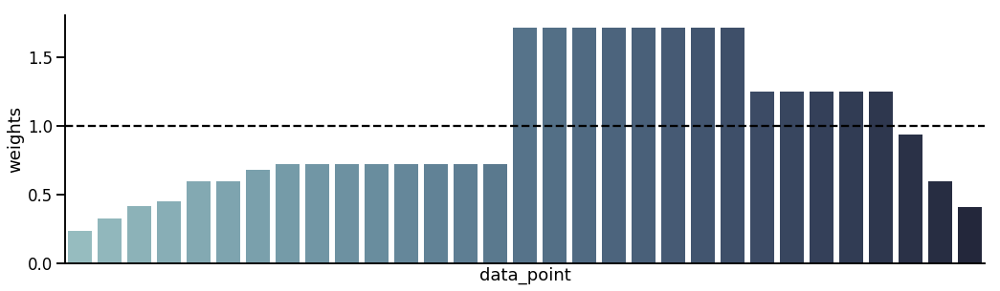

In [11]:
sns.set_context('talk')
g = plot_distance_weights(model, distance_fn)

In [12]:
g.savefig('results/iha-generic/dist-weights.pdf')

In [13]:
fitted, regression_fit, r2 = calculate_parameter_sensitivity(
    model,
    parameters,
    distance_fn,
    sigma=0.1,
    n_samples=1000)

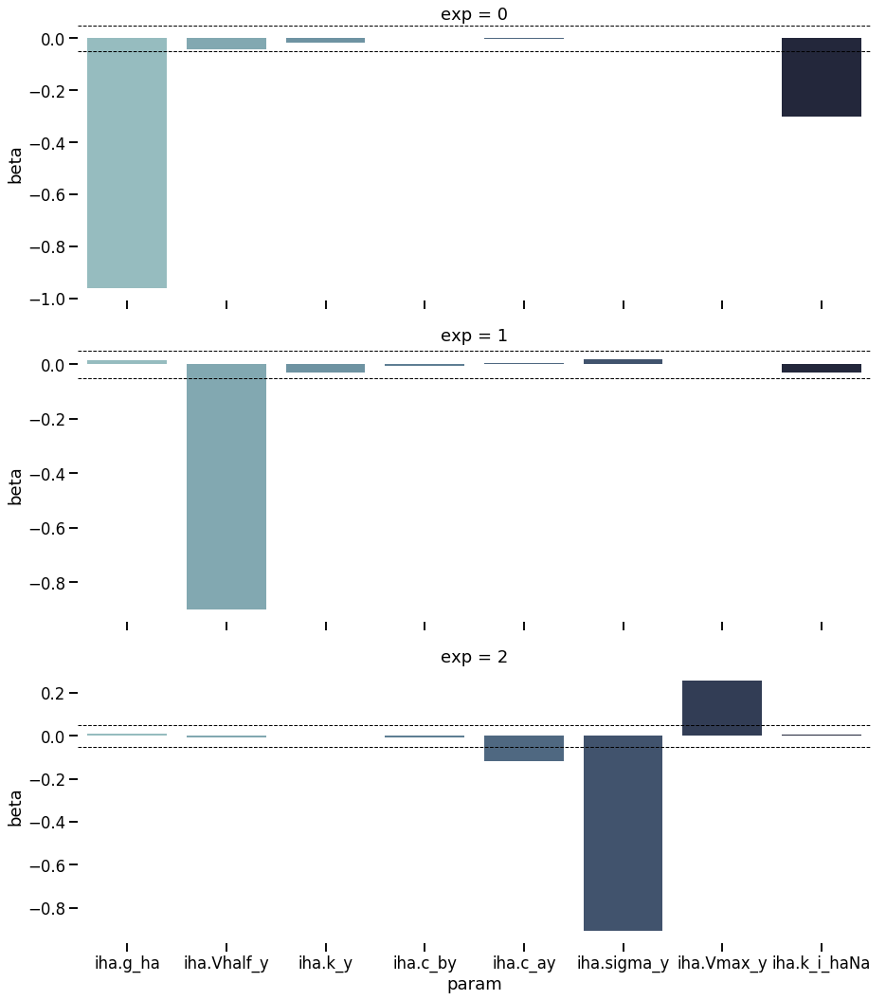

In [14]:
grid1 = plot_parameter_sensitivity(fitted, plot_cutoff=0.05)

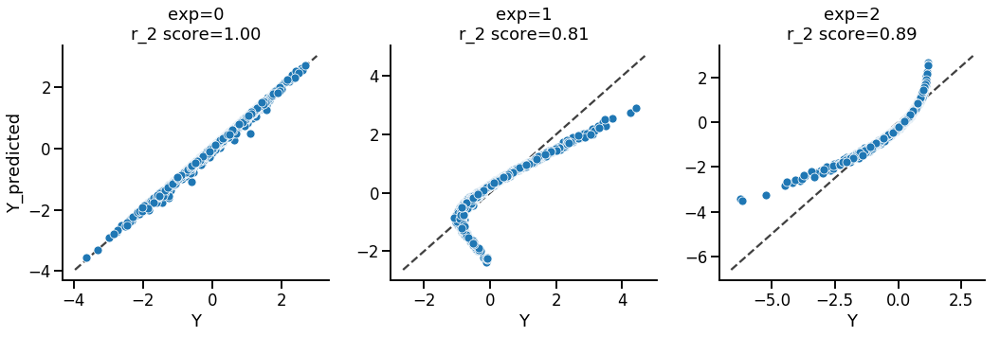

In [15]:
grid2 = plot_regression_fit(regression_fit, r2)

In [16]:
grid1.savefig('results/iha-generic/sensitivity.pdf')
grid2.savefig('results/iha-generic/regression_fit.pdf')

In [ ]:
# Finding insensitive parameters
cutoff = 0.05
fitted_pivot = fitted.pivot(index='param',columns='exp')
insensitive_params = fitted_pivot[(abs(fitted_pivot['beta'][0])<cutoff) & (abs(fitted_pivot['beta'][1])<cutoff) &
             (abs(fitted_pivot['beta'][2])<cutoff)].index.values

In [ ]:
insensitive_limits = dict((k, limits[k[4:]]) for k in insensitive_params)
insensitive_prior = Distribution(**{key: RV("uniform", a, b - a)
                                 for key, (a,b) in insensitive_limits.items()})

In [ ]:
# Generate random samples for insensitive parameters
def generate_sample(insensitive_prior, n):
    samples = [dict() for i in range(n)]
    for i in range(n):
        parameters = insensitive_prior.rvs()
        sample = {key: value for key, value in parameters.items()}
        samples[i].update(sample)
    return samples

In [ ]:
samples = generate_sample(insensitive_prior, 1000)

In [ ]:
model.add_external_par_samples(samples)

In [ ]:
# parameters passed to ABC algorithm
limits = dict((k, limits[k]) for k in limits if k[4:] not in insensitive_params)

In [10]:
prior = Distribution(**{key: RV("uniform", a, b - a)
                        for key, (a,b) in limits.items()})

# Initialise database

In [11]:
db_path = ('sqlite:///' + 
           os.path.join(tempfile.gettempdir(), "hl-1_iha-generic.db"))
print(db_path)

sqlite:////scratch/cph211/tmp/hl-1_iha-generic.db


In [12]:
# Let's log all the sh!t
import logging
logging.basicConfig()
abc_logger = logging.getLogger('ABC')
abc_logger.setLevel(logging.DEBUG)
eps_logger = logging.getLogger('Epsilon')
eps_logger.setLevel(logging.DEBUG)
cv_logger = logging.getLogger('CV Estimation')
cv_logger.setLevel(logging.DEBUG)

In [13]:
from pyabc.populationstrategy import ConstantPopulationSize

In [14]:
abc = ABCSMC(models=model,
             parameter_priors=prior,
             distance_function=IonChannelDistance(
                 obs=obs,
                 exp_map=exp,
                 err_bars=errs,
                 err_th=0.1),
             population_size=ConstantPopulationSize(2000),
             #population_size=AdaptivePopulationSize(
             #    start_nr_particles=5000,
             #    mean_cv=0.2,
             #    max_population_size=5000,
             #    min_population_size=2500),
             summary_statistics=ion_channel_sum_stats_calculator,
             transitions=EfficientMultivariateNormalTransition(),
             eps=MedianEpsilon(),
             sampler=MulticoreEvalParallelSampler(n_procs=6),
             acceptor=IonChannelAcceptor())

DEBUG:ABC:ion channel weights: {0: 0.23291016577034931, 1: 0.32545103225145916, 2: 0.4167902903278747, 3: 0.44824616129601674, 4: 0.5939261637172222, 5: 0.5939261637172222, 6: 0.6788076721341819, 7: 0.7233305530634934, 8: 0.7233305530634934, 9: 0.7233305530634934, 10: 0.7233305530634934, 11: 0.7233305530634934, 12: 0.7233305530634934, 13: 0.7233305530634934, 14: 0.7233305530634934, 15: 1.7185479328719149, 16: 1.7185479328719149, 17: 1.7185479328719149, 18: 1.7185479328719149, 19: 1.7185479328719149, 20: 1.7185479328719149, 21: 1.7185479328719149, 22: 1.7185479328719149, 23: 1.248162135043625, 24: 1.248162135043625, 25: 1.248162135043625, 26: 1.248162135043625, 27: 1.248162135043625, 28: 0.932608949870775, 29: 0.5934784226450392, 30: 0.40801641556846413}
DEBUG:Epsilon:init quantile_epsilon initial_epsilon=from_sample, quantile_multiplier=1


In [15]:
abc_id = abc.new(db_path, obs)

INFO:History:Start <ABCSMC(id=4, start_time=2018-11-18 09:48:39.659470, end_time=None)>
INFO:Epsilon:initial epsilon is 31.9957827986611


In [16]:
history = abc.run(minimum_epsilon=0.01, max_nr_populations=30, min_acceptance_rate=0.01)

INFO:ABC:t:0 eps:31.9957827986611
DEBUG:ABC:now submitting population 0
DEBUG:ABC:population 0 done
DEBUG:ABC:
total nr simulations up to t =0 is 3866
DEBUG:Epsilon:new eps, t=1, eps=6.620643363888335
INFO:ABC:t:1 eps:6.620643363888335
DEBUG:ABC:now submitting population 1
DEBUG:ABC:population 1 done
DEBUG:ABC:
total nr simulations up to t =1 is 8347
DEBUG:Epsilon:new eps, t=2, eps=5.459421753034149
INFO:ABC:t:2 eps:5.459421753034149
DEBUG:ABC:now submitting population 2
DEBUG:ABC:population 2 done
DEBUG:ABC:
total nr simulations up to t =2 is 13151
DEBUG:Epsilon:new eps, t=3, eps=4.8983122964654875
INFO:ABC:t:3 eps:4.8983122964654875
DEBUG:ABC:now submitting population 3
DEBUG:ABC:population 3 done
DEBUG:ABC:
total nr simulations up to t =3 is 19031
DEBUG:Epsilon:new eps, t=4, eps=4.501800089124554
INFO:ABC:t:4 eps:4.501800089124554
DEBUG:ABC:now submitting population 4
DEBUG:ABC:population 4 done
DEBUG:ABC:
total nr simulations up to t =4 is 26247
DEBUG:Epsilon:new eps, t=5, eps=4.18

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
DEBUG:ABC:population 11 done
DEBUG:ABC:
total nr simulations up to t =11 is 77278
DEBUG:Epsilon:new eps, t=12, eps=1.526389702550356
INFO:ABC:t:12 eps:1.526389702550356
DEBUG:ABC:now submitting population 12
DEBUG:ABC:population 12 done
DEBUG:ABC:
total nr

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch/cph211/miniconda3/envs/ionchannelABC/lib/python3.6/site-packages/pyabc-0.9.2-py3.6.egg/pyabc/transition/multivariatenormal.py:76: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.zeros(self.cov.shape[0]), self.cov))
/scratch

In [41]:
history = abc.run(minimum_epsilon=0.01, max_nr_populations=1, min_acceptance_rate=0.01)

INFO:ABC:t:44 eps:0.6423303168743204
DEBUG:ABC:now submitting population 44
DEBUG:ABC:population 44 done
DEBUG:ABC:
total nr simulations up to t =44 is 709733
DEBUG:Epsilon:new eps, t=45, eps=0.6398020328512203
INFO:History:Done <ABCSMC(id=4, start_time=2018-11-18 09:48:39.659470, end_time=2018-11-18 17:47:19.281409)>


# Results analysis

In [56]:
db_path = 'sqlite:////scratch/cph211/ion-channel-ABC/docs/examples/results/iha-generic/hl-1_iha-generic.db'
history = History(db_path)
history.all_runs()

[<ABCSMC(id=1, start_time=2018-11-16 17:01:52.575359, end_time=None)>,
 <ABCSMC(id=2, start_time=2018-11-16 17:50:53.667904, end_time=2018-11-17 01:34:51.857805)>,
 <ABCSMC(id=3, start_time=2018-11-17 09:17:53.553553, end_time=2018-11-17 21:10:33.923859)>,
 <ABCSMC(id=4, start_time=2018-11-18 09:48:39.659470, end_time=2018-11-18 17:47:19.281409)>]

In [57]:
history.id = 4

In [58]:
sns.set_context('talk')

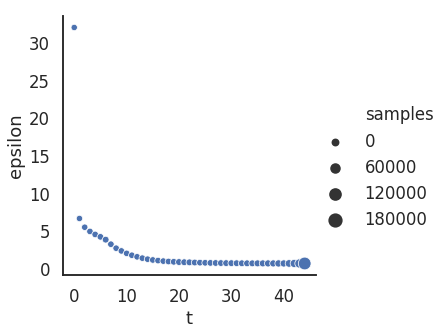

In [59]:
evolution = history.get_all_populations()
grid = sns.relplot(x='t', y='epsilon', size='samples', data=evolution[evolution.t>=0])
#grid.savefig('results/iha/eps_evolution.pdf')

In [60]:
df, w = history.get_distribution(m=0)

In [72]:
df.describe()

name,Vhalf_y,Vmax_y,c_ay,c_by,g_ha,k_i_haNa,k_y,sigma_y
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,-62.578036,99.184715,672166.379343,174.248922,0.095582,0.183394,-12.753631,74.414037
std,6.878457,11.223702,165922.507047,45.665279,0.002541,0.002636,6.171327,3.512512
min,-75.829310,52.437086,178576.323394,29.139590,0.089515,0.175136,-39.774191,62.145302
25%,-67.670048,92.010677,548383.478397,141.968377,0.093738,0.181581,-16.346918,72.089889
50%,-63.749840,99.845687,677475.762557,174.396361,0.095314,0.183547,-11.881987,74.413056
75%,-58.514399,107.034255,802317.289780,205.311447,0.097076,0.185183,-8.227074,76.783323
max,-34.772503,130.317156,998831.548007,307.281420,0.108092,0.191377,-0.689059,87.091217


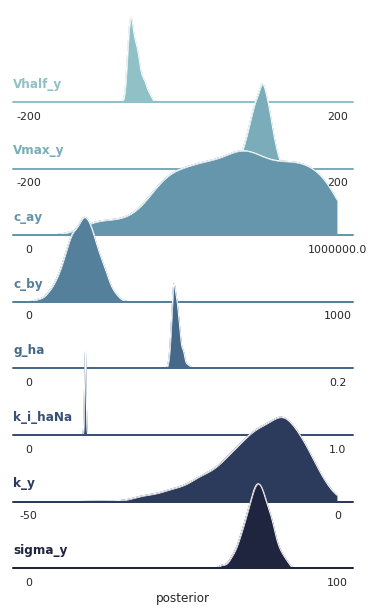

In [70]:
from ionchannelABC import plot_parameters_kde
sns.set_context('talk')
g = plot_parameters_kde(df, w, limits, aspect=5, height=1.1)

In [71]:
g.savefig('results/iha-generic/parameters_kde.pdf')

# Samples for quantitative analysis

In [63]:
# Generate parameter samples
n_samples = 100
df, w = history.get_distribution(m=0,t=30)
th_samples = df.sample(n=n_samples, weights=w, replace=True).to_dict(orient='records')

In [64]:
# Generate sim results samples
samples = pd.DataFrame({})
for i, th in enumerate(th_samples):
    output = model.sample(pars=th, n_x=50)
    output['sample'] = i
    output['distribution'] = 'post'
    samples = samples.append(output, ignore_index=True)

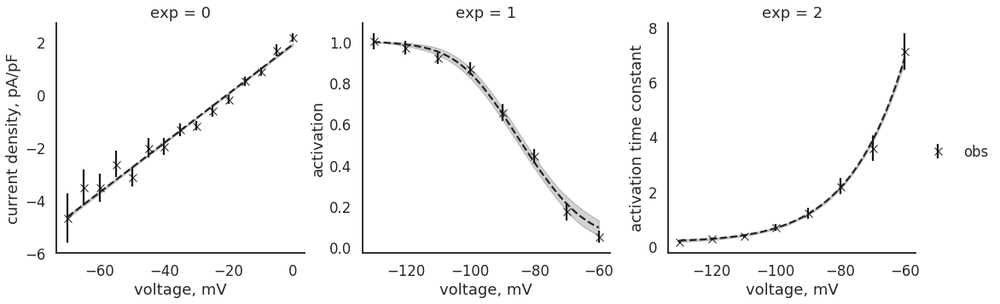

In [68]:
from ionchannelABC import plot_sim_results
sns.set_context('talk')
g = plot_sim_results(samples, obs=measurements)

# Set axis labels
xlabels = ["voltage, mV", "voltage, mV", "voltage, mV"]
ylabels = ["current density, pA/pF", "activation", "activation time constant"]
for ax, xl in zip(g.axes.flatten(), xlabels):
    ax.set_xlabel(xl)
for ax, yl in zip(g.axes.flatten(), ylabels):
    ax.set_ylabel(yl)

In [69]:
g.savefig('results/iha-generic/iha_sim_results.pdf')

In [37]:
# Fit linear line to current-voltage relationship
grouped = samples[samples['exp']==0].groupby('sample')
from scipy.optimize import curve_fit
def fit_linear_line(group):
    def linear_line(x, m, c):
        return m*x + c
    popt, _ = curve_fit(linear_line, group.x, group.y)
    m, c = popt[0], popt[1]
    x_intercept = -c / m
    return (x_intercept, m*1000)
output = grouped.apply(fit_linear_line).apply(pd.Series)

In [38]:
print(output.mean())
print(output.std())

0   -20.370234
1    93.077957
dtype: float64
0    0.650434
1    3.156427
dtype: float64


In [39]:
import scipy.stats as st
intercept = output[0].tolist()
rv = st.rv_discrete(values=(intercept, [1/len(intercept),]*len(intercept)))
print("median: {}".format(rv.median()))
print("95% CI: {}".format(rv.interval(0.95)))

median: -20.286562132822553
95% CI: (-21.595680320788755, -19.26516773793096)


In [40]:
slope = output[1].tolist()
rv = st.rv_discrete(values=(slope, [1/len(slope),]*len(slope)))
print("median: {}".format(rv.median()))
print("95% CI: {}".format(rv.interval(0.95)))

median: 93.10222319434108
95% CI: (87.3406956142571, 99.25241889516901)


In [41]:
# Fit of activation to Boltzmann equation
grouped = samples[samples['exp']==1].groupby('sample')
def fit_boltzmann(group):
    def boltzmann(V, Vhalf, K):
        return 1-1/(1+np.exp((Vhalf-V)/K))
    guess = (-100, 10)
    popt, _ = curve_fit(boltzmann, group.x, group.y,
                        bounds=([-200, 0], [0, 20]))
    return popt
output = grouped.apply(fit_boltzmann).apply(pd.Series)

In [42]:
print(output.mean())
print(output.std())

0   -85.848175
1    13.753345
dtype: float64
0    1.806274
1    1.225169
dtype: float64


In [43]:
Vhalf = output[0].tolist()
rv = st.rv_discrete(values=(Vhalf, [1/len(Vhalf),]*len(Vhalf)))
print("median: {}".format(rv.median()))
print("95% CI: {}".format(rv.interval(0.95)))

median: -85.68939988456549
95% CI: (-88.94472238741307, -82.86470982539777)


In [44]:
slope = output[1].tolist()
rv = st.rv_discrete(values=(slope, [1/len(slope),]*len(slope)))
print("median: {}".format(rv.median()))
print("95% CI: {}".format(rv.interval(0.95)))

median: 13.708939917852057
95% CI: (11.732205754390924, 15.86560257100461)


In [45]:
# Values of time constants at specific voltages
grouped = samples[samples['exp']==2].groupby('sample')
def get_tau(group):
    tau_60 = float(group[group.x==-60].y)
    tau_130 = float(group[group.x==-130].y)
    return (tau_60, tau_130)
output = grouped.apply(get_tau).apply(pd.Series)

In [46]:
print(output.mean())
print(output.std())

0    8.016504
1    0.065143
dtype: float64
0    0.743798
1    0.007042
dtype: float64


In [47]:
tau60 = output[0].tolist()
rv = st.rv_discrete(values=(tau60, [1/len(tau60),]*len(tau60)))
print("median: {}".format(rv.median()))
print("95% CI: {}".format(rv.interval(0.95)))

median: 7.980608366742066
95% CI: (6.376243469260935, 9.211873774086307)


In [48]:
tau130 = output[1].tolist()
rv = st.rv_discrete(values=(tau130, [1/len(tau130),]*len(tau130)))
print("median: {}".format(rv.median()))
print("95% CI: {}".format(rv.interval(0.95)))

median: 0.06493348310120706
95% CI: (0.0517044208894066, 0.08188310967716378)


# Weights of distance function

In [ ]:
from ionchannelABC import plot_distance_weights
grid = plot_distance_weights(model, distance_fn)

In [36]:
grid.savefig('results/iha/dist_weights.pdf')